In [1]:
import os, json, tqdm
import cv2
from PIL import Image
from IPython.display import display
import numpy as np

In [2]:
dataset_root_dir = '/data2/chence/PanoHeadData/single_view_hq'
dataset_meta_path = os.path.join(dataset_root_dir, 'dataset_v2_balanced_nohat.json')
parsing_dir = os.path.join(dataset_root_dir, 'align_parsing')
images_dir = os.path.join(dataset_root_dir, 'align_images')
mask_dir = os.path.join(dataset_root_dir, 'align_masks')
with open(dataset_meta_path, 'r') as f:
    dataset_meta = json.load(f)

In [7]:
color_map = {
    0: [0, 0, 0],       # Background - Black
    1: [128, 0, 0],     # Region 1 - Maroon
    2: [0, 128, 0],     # Region 2 - Green
    3: [128, 128, 0],   # Region 3 - Olive
    4: [0, 0, 128],     # Region 4 - Navy
    5: [128, 0, 128],   # Region 5 - Purple
    6: [0, 128, 128],   # Region 6 - Teal
    7: [128, 128, 128], # Region 7 - Gray
    8: [64, 0, 0],      # Region 8 - Darker Maroon
    9: [192, 0, 0],     # Region 9 - Brighter Maroon
    10: [64, 128, 0],   # Region 10 - Darker Olive
    11: [192, 128, 0],  # Region 11 - Brighter Olive
    12: [64, 0, 128],   # Region 12 - Darker Purple
    13: [192, 0, 128],  # Region 13 - Brighter Purple
    14: [64, 128, 128], # Region 14 - Darker Teal
    15: [192, 128, 128],# Region 15 - Brighter Teal
    16: [0, 64, 0],     # Region 16 - Darker Green
    17: [0, 192, 0],    # Region 17 - Brighter Green
    18: [0, 64, 64],    # Region 18 - Darker Navy
    19: [255, 255, 255] # Region 19 - White #! CC Modified
}
image_min_size = (512, 512)
other_min_size = (64, 64)

def process(image_path, mask_path, parsing_path):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    parsing = cv2.imread(parsing_path, cv2.IMREAD_GRAYSCALE)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    mask_expand = np.repeat(mask[:, :, np.newaxis], 3, axis=2)
    colorized_parsing = np.zeros((parsing.shape[0], parsing.shape[1], 3), dtype=np.uint8)
    for key, value in color_map.items():
        colorized_parsing[parsing == key] = value
    
    img_a = cv2.resize(image,   image_min_size, interpolation=cv2.INTER_LINEAR)
    image_b_small = cv2.resize(image, other_min_size, interpolation=cv2.INTER_LINEAR)
    image_b = cv2.resize(image_b_small, image_min_size, interpolation=cv2.INTER_LINEAR)
    image_c_small = cv2.resize(mask_expand, other_min_size, interpolation=cv2.INTER_NEAREST)
    image_c = cv2.resize(image_c_small, image_min_size, interpolation=cv2.INTER_NEAREST)
    image_d_small = cv2.resize(colorized_parsing, other_min_size, interpolation=cv2.INTER_NEAREST)
    image_d = cv2.resize(image_d_small, image_min_size, interpolation=cv2.INTER_NEAREST)
    cocated = np.concatenate([img_a, image_b,image_c, image_d], axis=1)
    return cocated

KeyboardInterrupt: 

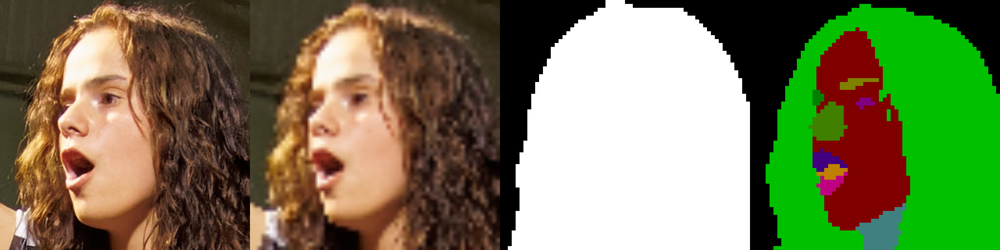

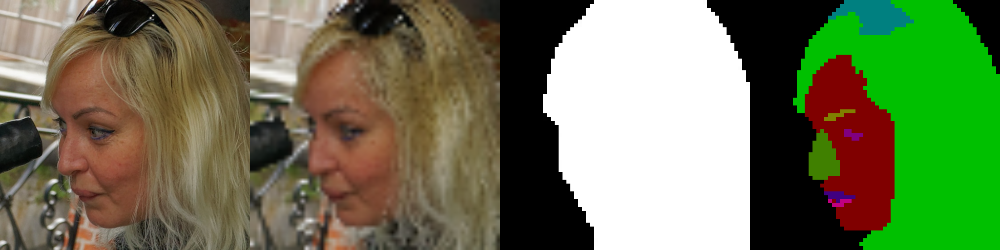

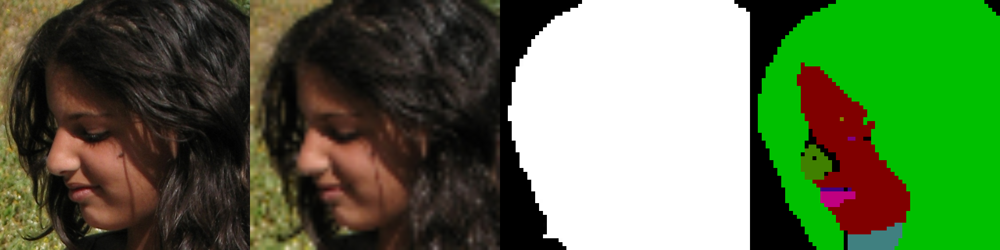

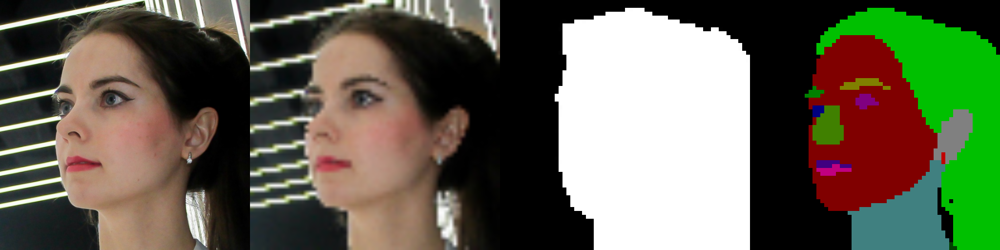

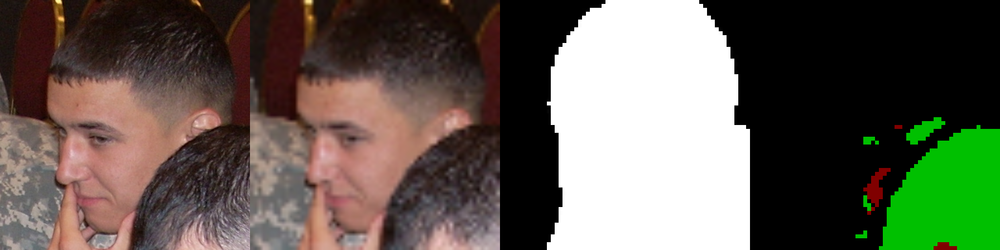

...

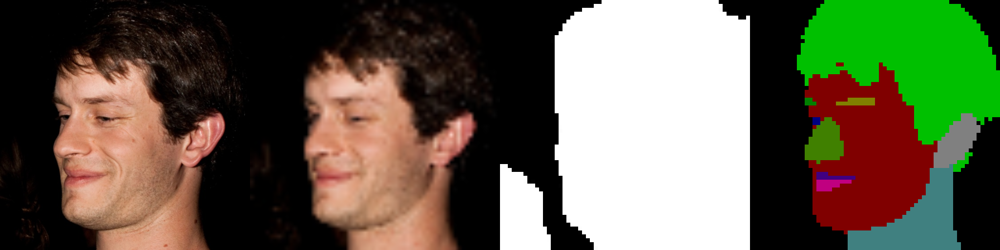

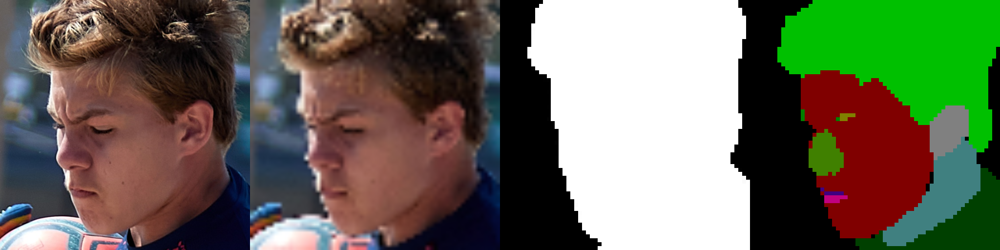

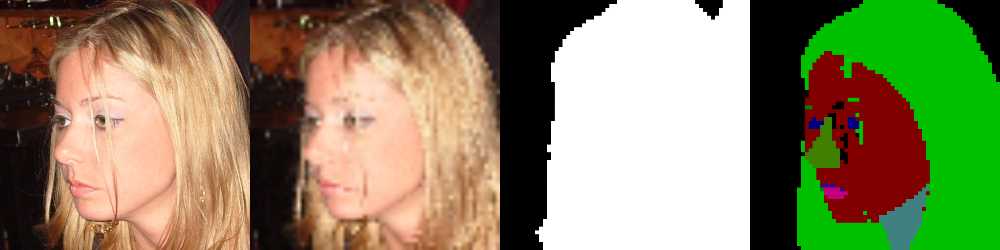

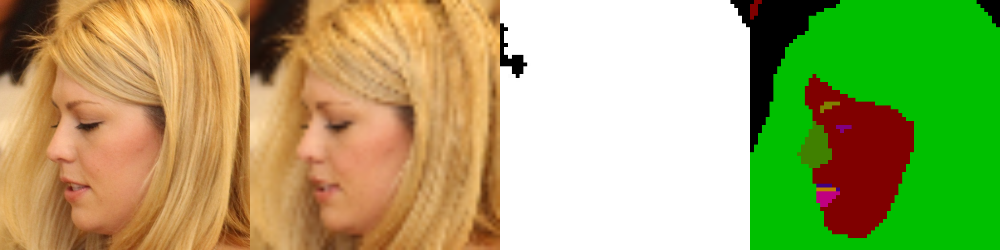

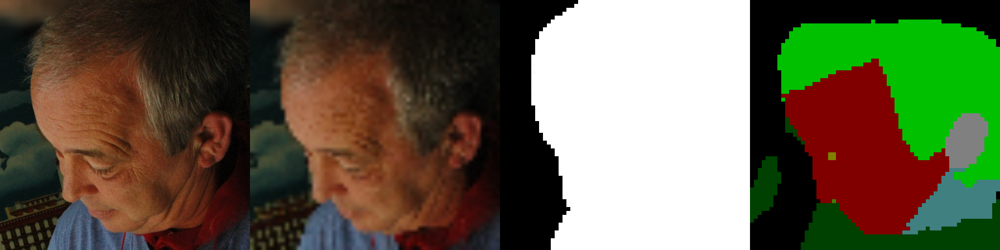

In [6]:
views = ['front', 'back', 'left', 'right']
vis_num = 20
vised = 0
# image_names = list(dataset_meta.keys())
# # random sample
# sampled = np.random.shuffle(image_names)
for image_name, image_meta in dataset_meta.items():
    view = image_meta['view']
    if view == 'left':
        vised += 1
        image_name_jpg = image_name.replace('.png', '.jpg')
        image_name_png = image_name_jpg.replace('.jpg', '.png')
        image_path = os.path.join(images_dir, image_name_jpg)
        mask_path = os.path.join(mask_dir, image_name_jpg)
        parsing_path = os.path.join(parsing_dir, image_name_png)
        res = process(image_path, mask_path, parsing_path)
        display(Image.fromarray(res))
        if vised == vis_num: break